In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import sys
sys.path.append("../helper_functions")
import duneapi_utils as d
import airtable_utils as a
import pandas_utils as p
sys.path.pop()

import dotenv
import os
dotenv.load_dotenv()

rerun_query = 1

# 3074513

In [2]:
# query_id = 3074513
# name = "T30D OP Mainnet Contract Usage Data"

# if rerun_query == 0:
#     deployers = pd.read_csv('csv_outputs/' + name + '.csv')
# else:
#     # Dune query: https://dune.com/queries/3074513
#     df = d.get_dune_data(query_id, name = name, num_hours_to_rerun = 4, performance = "large")

In [3]:
data = pd.read_csv('inputs/opmainnet_contract_usage_creator_level.csv')
data['dt'] = pd.to_datetime(data['dt'])

display(data.head(5))

,blockchain,dt,creator_address,num_txs_trace,num_address_users_trace,eth_fee_trace,gas_used_original,gas_used_trace,tx_gas_used,rn
0,op mainnet,2023-10-03 00:00:00+00:00,0xfffd3697b1d8fc4f0eac205d28ca842120b65511,1.0,1,0.000009,224598.0,26059.0,224598.0,1
1,op mainnet,2023-10-03 00:00:00+00:00,0xfffd3389655650627bd12a31f691d31b0e76d374,1.0,1,0.000008,202307.0,26047.0,202307.0,2
2,op mainnet,2023-10-03 00:00:00+00:00,0xfffd05ae9db4d5f4e23e2f37395db2f87359bf5d,1.0,1,0.000006,186318.0,25819.0,186318.0,3
3,op mainnet,2023-10-03 00:00:00+00:00,0xfffc6fbf96e97742e5f5e0f21c5c38e2b67e63a8,1.0,1,0.000008,202319.0,26059.0,202319.0,4
4,op mainnet,2023-10-03 00:00:00+00:00,0xfffa1f2b9596b422651ff07681207452fbae53fe,1.0,1,0.000008,202319.0,26059.0,202319.0,5


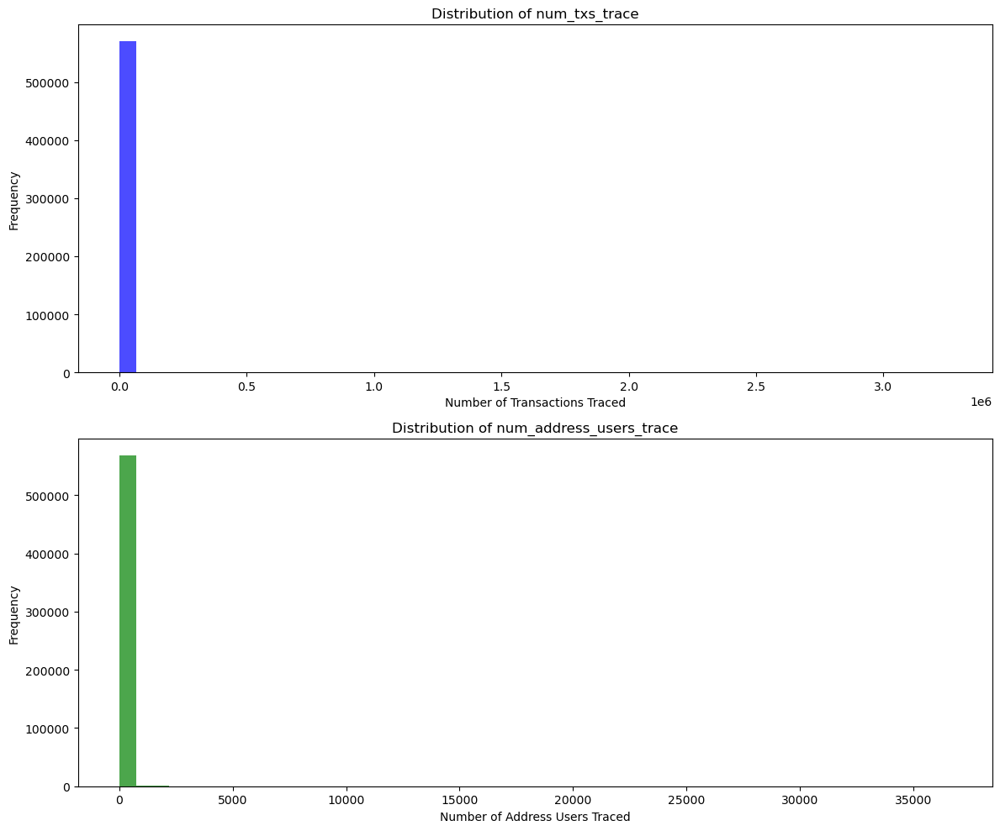

In [4]:
# Plotting the distribution for num_txs_trace and num_address_users_trace
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

# Plotting histogram for num_txs_trace
ax[0].hist(data['num_txs_trace'], bins=50, color='blue', alpha=0.7)
ax[0].set_title('Distribution of num_txs_trace')
ax[0].set_xlabel('Number of Transactions Traced')
ax[0].set_ylabel('Frequency')

# Plotting histogram for num_address_users_trace
ax[1].hist(data['num_address_users_trace'], bins=50, color='green', alpha=0.7)
ax[1].set_title('Distribution of num_address_users_trace')
ax[1].set_xlabel('Number of Address Users Traced')
ax[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


In [5]:
# Calculating percentiles for the two columns
percentiles = [25, 50, 75, 90, 95, 99]
num_txs_trace_percentiles = data['num_txs_trace'].quantile([p/100 for p in percentiles])
num_address_users_trace_percentiles = data['num_address_users_trace'].quantile([p/100 for p in percentiles])

num_txs_trace_percentiles, num_address_users_trace_percentiles



(0.25       1.00
 0.50       2.00
 0.75       4.00
 0.90       8.00
 0.95      18.00
 0.99    1126.84
 Name: num_txs_trace, dtype: float64,
 0.25      1.0
 0.50      1.0
 0.75      1.0
 0.90      1.0
 0.95      1.0
 0.99    100.0
 Name: num_address_users_trace, dtype: float64)

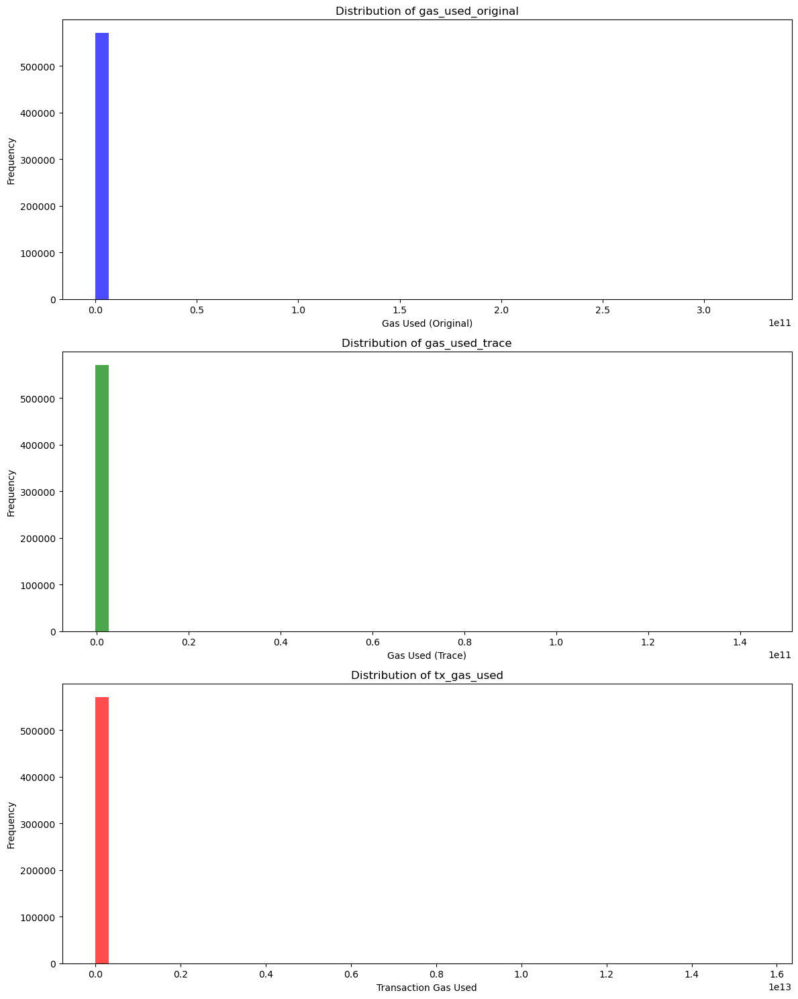

In [6]:
# Plotting the distribution for gas_used_original, gas_used_trace, and tx_gas_used
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(12, 15))

# Plotting histogram for gas_used_original
ax[0].hist(data['gas_used_original'], bins=50, color='blue', alpha=0.7)
ax[0].set_title('Distribution of gas_used_original')
ax[0].set_xlabel('Gas Used (Original)')
ax[0].set_ylabel('Frequency')

# Plotting histogram for gas_used_trace
ax[1].hist(data['gas_used_trace'], bins=50, color='green', alpha=0.7)
ax[1].set_title('Distribution of gas_used_trace')
ax[1].set_xlabel('Gas Used (Trace)')
ax[1].set_ylabel('Frequency')

# Plotting histogram for tx_gas_used
ax[2].hist(data['tx_gas_used'], bins=50, color='red', alpha=0.7)
ax[2].set_title('Distribution of tx_gas_used')
ax[2].set_xlabel('Transaction Gas Used')
ax[2].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


In [7]:
# Aggregating the total gas used by each creator
creator_gas_usage = data.groupby('creator_address')['tx_gas_used'].sum().sort_values(ascending=False).reset_index()

# Display the top creators by gas usage
creator_gas_usage.head()


,creator_address,tx_gas_used
0,0xaf18644083151cf57f914cccc23c42a1892c218e,2.143183e+14
1,0x849a19c0746fb0d335e02dec0d0b3e057e585176,8.837074e+13
2,0x9ec1c3dcf667f2035fb4cd2eb42a1566fd54d2b7,6.168327e+13
3,0x1f98431c8ad98523631ae4a59f267346ea31f984,2.403779e+13
4,0xc73fc08c931efe3fce850c09278472e8a81c2e05,1.816174e+13


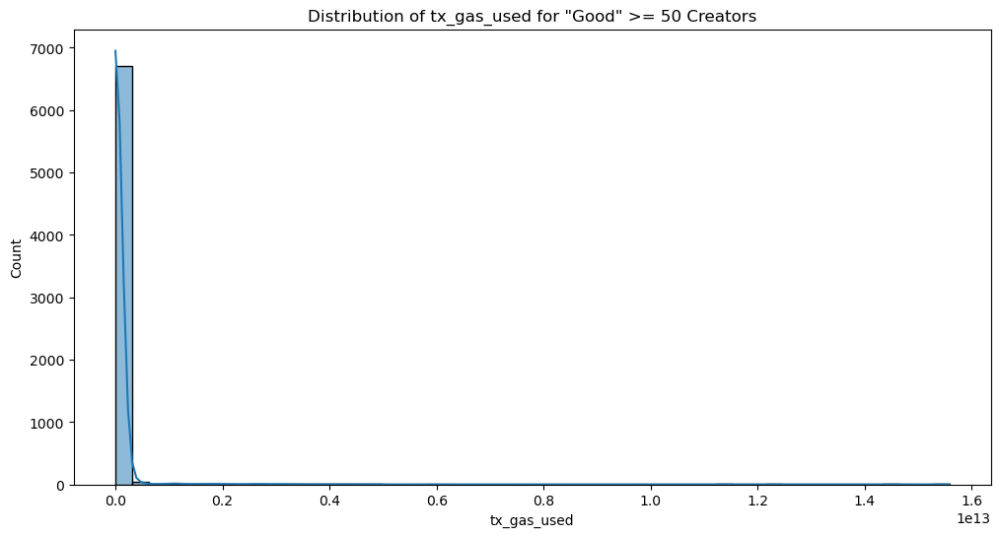

In [8]:
# Create a date range for the last 28 days
last_date = data['dt'].max()
date_range = pd.date_range(last_date - pd.Timedelta(days=27), last_date)

# Expand the dataset to ensure each creator has an entry for each date in the date range
expanded_data = (data.set_index(['dt', 'creator_address'])
                 .reindex(pd.MultiIndex.from_product([date_range, data['creator_address'].unique()], 
                                                     names=['dt', 'creator_address']))
                 .reset_index())

# Fill in missing values with 0
expanded_data.fillna(0, inplace=True)

# Group by creator and calculate the median number of transacting addresses per day over the 28-day period
median_addresses = expanded_data.groupby('creator_address')['num_address_users_trace'].median()

med_addr = 50
# Filter creators with a median of at least 50 transacting addresses per day
good_creators = median_addresses[median_addresses >= med_addr].index
filtered_data = expanded_data[expanded_data['creator_address'].isin(good_creators)]

# Plot the distributions of gas usage for the filtered "good" creators
fig, ax = plt.subplots(figsize=(12, 6))

sns.histplot(filtered_data['tx_gas_used'], bins=50, ax=ax, kde=True)
ax.set_title('Distribution of tx_gas_used for "Good" >= ' + str(med_addr) + ' Creators')

plt.show()


In [9]:
import plotly.express as px

# Ensure the 'dt' column is in datetime format
data['dt'] = pd.to_datetime(data['dt'])

pct = 99
# Determine overflow threshold (e.g., 99th percentile)
threshold = data['tx_gas_used'].quantile(pct/100)

# Cap values at the threshold
data_cap = data#[ data['tx_gas_used'] >= 100_000].copy()
data_cap['capped_tx_gas_used'] = data_cap['tx_gas_used'].clip(upper=threshold)

# Label data by "good" creator status
data_cap['status'] = data_cap['creator_address'].isin(good_creators)
data_cap['status'] = data_cap['status'].replace({True: 'Good >= ' + str(med_addr) + ' Addr/Day', False: 'Not Good'})

# Plot using Plotly
fig = px.histogram(data_cap, x='capped_tx_gas_used', color='status', nbins=100, 
                   title='Distribution of Tx Gas Used (Capped at '+str(pct)+ 'th Percentile)', 
                   labels={'capped_gas_used': 'Gas Used (Capped)', 'status': 'Creator Status'})
fig.show()


In [17]:
from scipy.stats import percentileofscore

# Compute the median of tx_gas_used for each creator over the 28-day period
median_gas_used = data_cap.groupby(['creator_address','status'])['tx_gas_used'].median().reset_index()
median_gas_used_good = median_gas_used[median_gas_used['status']=='Good']
display(median_gas_used)

value = 30 * 1e6 #30000000  # 30 million
percentile = percentileofscore(median_gas_used['tx_gas_used'], value)
percentile_good = percentileofscore(median_gas_used_good['tx_gas_used'], value)

# Format the output text
output_text = f"{value/1e6} million is the {percentile:.2f}th percentile."
output_text_good = f"{value/1e6} million is the {percentile_good:.2f}th percentile of 'Good' contracts."

print(output_text)
print(output_text_good)

percentile = percentileofscore(median_gas_used[median_gas_used['tx_gas_used']>0]['tx_gas_used'], value)

# Format the output text
output_text = f"{value/1e6} million is the {percentile:.2f}th percentile of > 0."

print(output_text)


,creator_address,status,tx_gas_used
0,0x0000000000000eaab797c033cda6935a85f1a660,Not Good,392428.0
1,0x0000000000003d61b3d0a96b70b9c9006947759c,Not Good,24799215.0
2,0x0000000000006396ff2a80c067f99b3d2ab4df24,Not Good,157785689.5
3,0x00000000000dc7f163742eb4abef650037b1f588,Not Good,929361.0
4,0x00000000005084f1f02771eadfb9d0aa2953b577,Not Good,941576.5
...,...,...,...
238873,0xffffa0f5964f47ecb247357714208d391f059c06,Not Good,350662.0
238874,0xffffd230115df924d3b805624437f4e47281c3f8,Not Good,1044708.0
238875,0xffffeada6c8e9fc94cb94c4d8e48a5339016f5fb,Not Good,29536.0
238876,0xfffff9b1c2c387b1e3d19af292d91d913374f42b,Not Good,196962.0


30.0 million is the 99.65th percentile.
30.0 million is the nanth percentile of 'Good' contracts.
30.0 million is the 99.65th percentile of > 0.


In [11]:

# display(expanded_data[expanded_data['creator_address'] == '0x5472cf4f1be2aa6ad27c6f93101f7899ccadbaf7'])
# display(median_gas_used[median_gas_used['creator_address'] == '0x5472cf4f1be2aa6ad27c6f93101f7899ccadbaf7'])
# Label data by "good" creator status
median_gas_used['status'] = median_gas_used['creator_address'].isin(good_creators)
median_gas_used['status'] = median_gas_used['status'].replace({True: 'Good', False: 'Not Good'})

median_gas_used = median_gas_used[median_gas_used['tx_gas_used'] > 0]

# Determine overflow threshold (e.g., 99th percentile for the median values)
threshold = median_gas_used['tx_gas_used'].quantile(0.9)
print(threshold)

# Cap values at the threshold
median_gas_used['capped_gas_used'] = median_gas_used['tx_gas_used'].where(median_gas_used['tx_gas_used'] <= threshold, threshold)


# Plot using Plotly
fig = px.histogram(median_gas_used, x='capped_gas_used', color='status', nbins=100, 
                   title='Distribution of Median Gas Used (Capped at 99th Percentile)', 
                   labels={'capped_gas_used': 'Median Gas Used (Capped)', 'status': 'Creator Status'})
fig.show()

display( median_gas_used[(median_gas_used['status'] == 'Good')&(median_gas_used['capped_gas_used'] > 0)].sort_values(by='tx_gas_used',ascending=True))


105833511.89999998


,creator_address,tx_gas_used,status,capped_gas_used
76945,0x5472cf4f1be2aa6ad27c6f93101f7899ccadbaf7,3.446205e+06,Good,3446205.0
82690,0x5acaf86db8c7e24da9ef91a73707dfe5f076091a,3.446205e+06,Good,3446205.0
66714,0x49000b54784c0359a9ed744a5f3505d39043e451,5.548054e+06,Good,5548053.5
56136,0x3d99d601e22fd019e1913d6cab65526d959d7d0f,6.160538e+06,Good,6160538.0
132929,0x92750f95c3a9036e4836fe3a64070ea46f8fdedd,6.183632e+06,Good,6183632.5
...,...,...,...,...
29022,0x1f98431c8ad98523631ae4a59f267346ea31f984,3.524869e+11,Good,105833511.9
180238,0xc73fc08c931efe3fce850c09278472e8a81c2e05,8.889066e+11,Good,105833511.9
120491,0x849a19c0746fb0d335e02dec0d0b3e057e585176,2.607632e+12,Good,105833511.9
144149,0x9ec1c3dcf667f2035fb4cd2eb42a1566fd54d2b7,2.687598e+12,Good,105833511.9
